In [111]:
import os
import sys
import json
#import tweepy
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import pyspark.sql.types as T
import pyspark.sql.functions as F
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from pyspark.sql import SparkSession
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from pyspark.sql.functions import explode, split, col
from mpl_toolkits.basemap import Basemap
from IPython.display import HTML
import pandas as pd
from vaderSentiment.vaderSentiment mport SentimentIntensityAnalyzer
from IPython.display import HTML

In [112]:
!conda list | findstr pyspark


pyspark                   3.4.0              pyhd8ed1ab_0    conda-forge


In [113]:
from pyspark.sql import SparkSession

spark = SparkSession.builder.appName("myApp").getOrCreate()
print(spark.version)

3.4.0


In [117]:
spark = SparkSession.builder.appName("myApp").getOrCreate()
spark = SparkSession.builder.config("spark.driver.memory", "10g").appName("bigdata").getOrCreate()
df = spark.read.json("svb.json")


In [118]:
df.show(10, False)

+------------+-----------+------------------------------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [119]:
df.show(1)

+------------+-----------+--------------------+--------------------+--------------------+--------------+---------+----+-------------------+-------------------+-----------------------+---------------------+-------------------------+-------------------+-----------------------+---------------+----+------------+-----+------------------+-------------+----------------+--------------------+-------------+---------+--------------------+--------------------+--------------------+---------+--------------------+---------------------+
|contributors|coordinates|          created_at|            entities|   extended_entities|favorite_count|favorited| geo|                 id|             id_str|in_reply_to_screen_name|in_reply_to_status_id|in_reply_to_status_id_str|in_reply_to_user_id|in_reply_to_user_id_str|is_quote_status|lang|    metadata|place|possibly_sensitive|quoted_status|quoted_status_id|quoted_status_id_str|retweet_count|retweeted|    retweeted_status|              source|                text|

In [120]:
df.printSchema()

root
 |-- contributors: string (nullable = true)
 |-- coordinates: string (nullable = true)
 |-- created_at: string (nullable = true)
 |-- entities: struct (nullable = true)
 |    |-- hashtags: array (nullable = true)
 |    |    |-- element: struct (containsNull = true)
 |    |    |    |-- indices: array (nullable = true)
 |    |    |    |    |-- element: long (containsNull = true)
 |    |    |    |-- text: string (nullable = true)
 |    |-- media: array (nullable = true)
 |    |    |-- element: struct (containsNull = true)
 |    |    |    |-- display_url: string (nullable = true)
 |    |    |    |-- expanded_url: string (nullable = true)
 |    |    |    |-- id: long (nullable = true)
 |    |    |    |-- id_str: string (nullable = true)
 |    |    |    |-- indices: array (nullable = true)
 |    |    |    |    |-- element: long (containsNull = true)
 |    |    |    |-- media_url: string (nullable = true)
 |    |    |    |-- media_url_https: string (nullable = true)
 |    |    |    |-- s

In [121]:
filtered_df = df.filter(df.text.contains("SVB Collapse"))
filtered_df.show()

+------------+-----------+--------------------+--------------------+--------------------+--------------+---------+----+-------------------+-------------------+-----------------------+---------------------+-------------------------+-------------------+-----------------------+---------------+----+------------+-----+------------------+-------------+----------------+--------------------+-------------+---------+--------------------+--------------------+--------------------+---------+--------------------+---------------------+
|contributors|coordinates|          created_at|            entities|   extended_entities|favorite_count|favorited| geo|                 id|             id_str|in_reply_to_screen_name|in_reply_to_status_id|in_reply_to_status_id_str|in_reply_to_user_id|in_reply_to_user_id_str|is_quote_status|lang|    metadata|place|possibly_sensitive|quoted_status|quoted_status_id|quoted_status_id_str|retweet_count|retweeted|    retweeted_status|              source|                text|

In [123]:
display(df.select("id", "created_at", "text", "source", "lang", "user.name", "user.screen_name", "user.followers_count", "retweet_count", "favorite_count"))
df.select("id", "created_at", "text", "source", "lang", "user.name", "user.screen_name", "user.followers_count", "retweet_count", "favorite_count").show(100)


DataFrame[id: bigint, created_at: string, text: string, source: string, lang: string, name: string, screen_name: string, followers_count: bigint, retweet_count: bigint, favorite_count: bigint]

+-------------------+--------------------+-----------------------------------+--------------------+----+--------------------------+---------------+---------------+-------------+--------------+
|                 id|          created_at|                               text|              source|lang|                      name|    screen_name|followers_count|retweet_count|favorite_count|
+-------------------+--------------------+-----------------------------------+--------------------+----+--------------------------+---------------+---------------+-------------+--------------+
|1641081634718883841|Wed Mar 29 14:15:...|               RT @es_tradingvie...|<a href="https://...|  es|                 Israel V.|ExtasisCerebral|            682|            5|             0|
|1641081598949969921|Wed Mar 29 14:15:...|               RT @CNN: Regulato...|<a href="http://t...|  en|               LOBALOBA’23|      _Tobihano|           3703|            1|             0|
|1641081598404591616|Wed Mar 29 14:

In [124]:
pandas_df = df.select("id", "created_at", "text", "source", "lang", "user.name", "user.screen_name", "user.followers_count", "retweet_count", "favorite_count").toPandas()
html_table = pandas_df.to_html(index=False)
display(HTML(html_table))

id,created_at,text,source,lang,name,screen_name,followers_count,retweet_count,favorite_count
1641081634718883841,Wed Mar 29 14:15:26 +0000 2023,RT @es_tradingview: ¡El banco estadounidense SVB llegó a caer a un centavo la acción! 😵 https://t.co/rKk8xLYzkq,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>",es,Israel V.,ExtasisCerebral,682,5,0
1641081598949969921,Wed Mar 29 14:15:17 +0000 2023,RT @CNN: Regulators revealed that customers of Silicon Valley Bank tried to withdraw $100 billion from the bank the day it failed https://t…,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",en,LOBALOBA’23,_Tobihano,3703,1,0
1641081598404591616,Wed Mar 29 14:15:17 +0000 2023,The Congressional inquiry into the failures of Silicon Valley Bank and Signature Bank continues today in the House.… https://t.co/j2I2eDTGOo,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",en,Emily Flitter,FlitterOnFraud,21421,0,0
1641081570026213376,Wed Mar 29 14:15:10 +0000 2023,RT @CNBC: LIVE: House Financial Services Committee holds hearing on SVB and Signature Bank collapses\nhttps://t.co/Vb6ycorJ9T,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",en,🇯🇵TOKYO 2023🇫🇷🇨🇦🇬🇧🇲🇲🇭🇰🇹🇼🇺🇸🇮🇹🇩🇪,gon20207,24,1,0
1641081549612277760,Wed Mar 29 14:15:05 +0000 2023,RT @KobeissiLetter: The FDIC said the 10 largest accounts at SVB had $13.3 billion in deposits.\n\nThis means 8% of SVB’s deposits were held…,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",en,Patriot AtHeart,Mizhap23,1956,15,0
1641081547385339909,Wed Mar 29 14:15:05 +0000 2023,RT @tsuchie88: 極めつけが、SVB破綻に続く金融の混乱が将来的な金融規制強化の方向に向かえば、開業にこぎつけたところで先行きがよくわからなくなってしまう。テック企業の株価下落で、ZHDの親会社SBの資産も目減りしているし、ジャックマー帝国の解体と個別上場など、直近…,"<a href=""http://twitter.com/#!/download/ipad"" rel=""nofollow"">Twitter for iPad</a>",ja,Kei Nishikawa,KeiNishikawa3,628,2,0
1641081544319160326,Wed Mar 29 14:15:04 +0000 2023,Regulators revealed that customers of Silicon Valley Bank tried to withdraw $100 billion from the bank the day it f… https://t.co/DStqh0CbYD,"<a href=""http://www.socialflow.com"" rel=""nofollow"">SocialFlow</a>",en,CNN,CNN,61302250,1,1
1641081529957793795,Wed Mar 29 14:15:01 +0000 2023,I realize most of the financial world has moved on from Silicon Valley Bank (SVB). And why not. The zeitgeist is th… https://t.co/uZzCa6r4Bt,"<a href=""https://secure.fmgsuite.com"" rel=""nofollow"">FMG Social</a>",en,Privada Wealth Management,PrivadaWealth,25,0,0
1641081501331644419,Wed Mar 29 14:14:54 +0000 2023,RT @FerroTV: I see lots of people mentioning these numbers and talking about bank runs in the age of digital banking... I get it..\n\nBut for…,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",en,Paul Rizzo,PaulRiz504,299,9,0
1641081493773492224,Wed Mar 29 14:14:52 +0000 2023,RT @WallStreetSilv: Regulators blame social media for SVB's rapid collapse: 'Complete game changer'\n\nIt’s our fault on Twitter for talking…,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",en,Alexander Ramirez,Alexand33445084,136,451,0


In [125]:
selected_df = df.select("contributors", "coordinates", "created_at", "entities", "extended_entities", "favorite_count", "favorited", "geo", "id", "id_str", "in_reply_to_screen_name", "in_reply_to_status_id", "in_reply_to_status_id_str", "in_reply_to_user_id", "in_reply_to_user_id_str", "is_quote_status", "lang", "metadata", "place", "possibly_sensitive", "quoted_status", "quoted_status_id", "quoted_status_id_str", "retweet_count", "retweeted", "retweeted_status", "source", "text", "truncated", "user", "withheld_in_countries")
selected_df.show()

+------------+-----------+--------------------+--------------------+--------------------+--------------+---------+----+-------------------+-------------------+-----------------------+---------------------+-------------------------+-------------------+-----------------------+---------------+----+------------+-----+------------------+-------------+-------------------+--------------------+-------------+---------+--------------------+--------------------+----------------------+---------+--------------------+---------------------+
|contributors|coordinates|          created_at|            entities|   extended_entities|favorite_count|favorited| geo|                 id|             id_str|in_reply_to_screen_name|in_reply_to_status_id|in_reply_to_status_id_str|in_reply_to_user_id|in_reply_to_user_id_str|is_quote_status|lang|    metadata|place|possibly_sensitive|quoted_status|   quoted_status_id|quoted_status_id_str|retweet_count|retweeted|    retweeted_status|              source|             

In [126]:
selected_df2 = df.select( "favorite_count", "favorited", "geo", "id", "id_str", "lang", "place", "possibly_sensitive", "retweet_count", "source", "text",  "user", )
selected_df2.show()

+--------------+---------+----+-------------------+-------------------+----+-----+------------------+-------------+--------------------+----------------------+--------------------+
|favorite_count|favorited| geo|                 id|             id_str|lang|place|possibly_sensitive|retweet_count|              source|                  text|                user|
+--------------+---------+----+-------------------+-------------------+----+-----+------------------+-------------+--------------------+----------------------+--------------------+
|             0|    false|null|1641081634718883841|1641081634718883841|  es| null|             false|            5|<a href="https://...|  RT @es_tradingvie...|{false, Sat Oct 2...|
|             0|    false|null|1641081598949969921|1641081598949969921|  en| null|              null|            1|<a href="http://t...|  RT @CNN: Regulato...|{false, Thu Sep 0...|
|             0|    false|null|1641081598404591616|1641081598404591616|  en| null|             

In [127]:
filtered_df3 = df.filter(df.lang == "en")
filtered_df3.show(100)


+------------+-----------+--------------------+--------------------+-----------------+--------------+---------+----+-------------------+-------------------+-----------------------+---------------------+-------------------------+-------------------+-----------------------+---------------+----+------------+-----+------------------+--------------------+-------------------+--------------------+-------------+---------+--------------------+--------------------+--------------------+---------+--------------------+---------------------+
|contributors|coordinates|          created_at|            entities|extended_entities|favorite_count|favorited| geo|                 id|             id_str|in_reply_to_screen_name|in_reply_to_status_id|in_reply_to_status_id_str|in_reply_to_user_id|in_reply_to_user_id_str|is_quote_status|lang|    metadata|place|possibly_sensitive|       quoted_status|   quoted_status_id|quoted_status_id_str|retweet_count|retweeted|    retweeted_status|              source|       

In [128]:
grouped_df = df.groupBy("lang").count()
grouped_df.show()

+----+-----+
|lang|count|
+----+-----+
|  en| 7652|
|  vi|   42|
|  ne|    3|
|  sl|    2|
|  ro|    1|
| und|  162|
|  ur|    5|
|  pl|   20|
|  pt|  112|
|  tl|    5|
|  in|   44|
|  ko|   89|
|  uk|    1|
|  cs|    6|
|  tr|   80|
|  is|   29|
|  de|   73|
|  es|  246|
|  el|    4|
|  it|   39|
+----+-----+
only showing top 20 rows



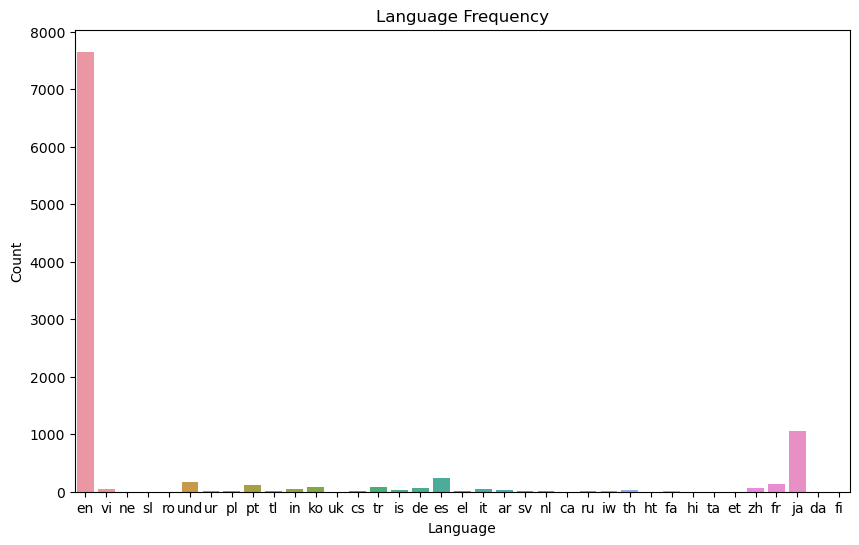

In [129]:
freq_df = grouped_df.toPandas()
plt.figure(figsize=(10, 6))
sns.barplot(x="lang", y="count", data=freq_df)
plt.title("Language Frequency")
plt.xlabel("Language")
plt.ylabel("Count")
plt.show()

In [130]:
df1 = df.select("id", "text")
df2 = df.select("id", "favorite_count")
joined_df = df1.join(df2, "id")
joined_df.show()

+-------------------+----------------------+--------------+
|                 id|                  text|favorite_count|
+-------------------+----------------------+--------------+
|1641081634718883841|  RT @es_tradingvie...|             0|
|1641081598949969921|  RT @CNN: Regulato...|             0|
|1641081598404591616|  The Congressional...|             0|
|1641081570026213376|  RT @CNBC: LIVE: H...|             0|
|1641081549612277760|  RT @KobeissiLette...|             0|
|1641081547385339909|RT @tsuchie88: 極め...|             0|
|1641081544319160326|  Regulators reveal...|             1|
|1641081529957793795|  I realize most of...|             0|
|1641081501331644419|  RT @FerroTV: I se...|             0|
|1641081493773492224|  RT @WallStreetSil...|             0|
|1641081468842827776|  @RawonStats Menun...|             1|
|1641081455458541570|  Mass Shootings Ou...|             0|
|1641081446843531265|  RT @lopezlinette:...|             0|
|1641081440023502852|  @magsonthemoon @F..

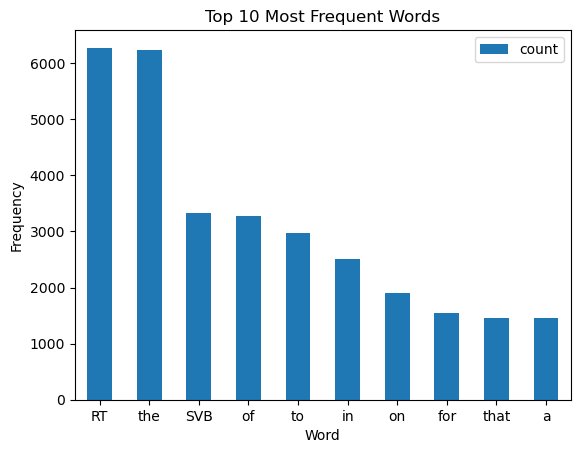

In [131]:
from pyspark.sql.functions import col, explode, split

word_df = df.select(explode(split(col("text"), " ")).alias("word"))
freq_df = word_df.groupBy("word").count().orderBy(col("count").desc())
top_10_freq_df = freq_df.limit(10)
top_10_freq_df.toPandas().plot.bar(x="word", y="count", rot=0)
plt.xlabel("Word")
plt.ylabel("Frequency")
plt.title("Top 10 Most Frequent Words")
plt.show()

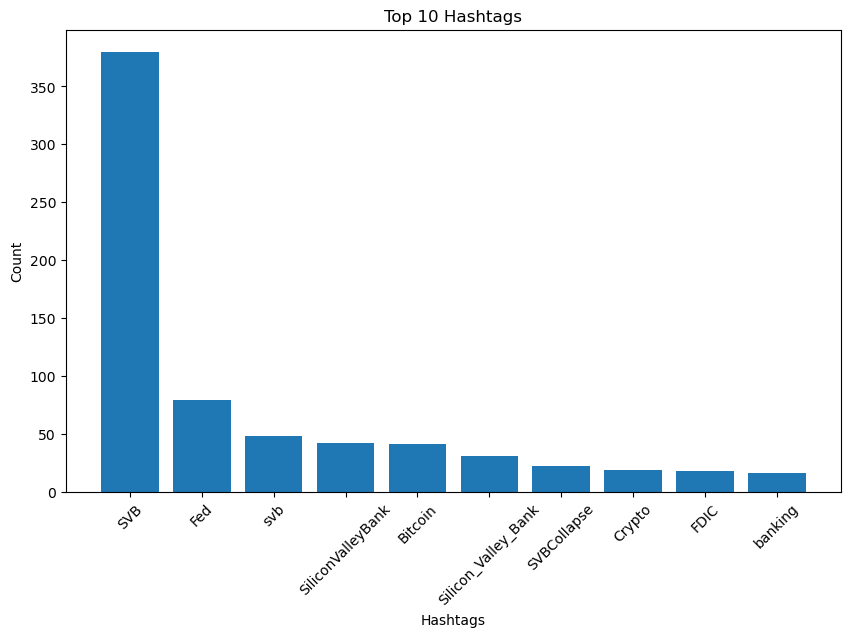

In [80]:
from pyspark.sql.functions import *
from pyspark.sql import SparkSession
import matplotlib.pyplot as plt

spark = SparkSession.builder.appName("HashtagAnalysis").getOrCreate()

hashtags_df = df.select(explode("entities.hashtags.text").alias("hashtag"))
hashtag_counts = hashtags_df.groupBy("hashtag").count().orderBy(col("count").desc())

pandas_df = hashtag_counts.limit(10).toPandas()

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(pandas_df["hashtag"], pandas_df["count"])
ax.set_title("Top 10 Hashtags")
ax.set_xlabel("Hashtags")
ax.set_ylabel("Count")
plt.xticks(rotation=45)
plt.show()

In [132]:
print(f"Total number of rows: {df.count()}")

print("\nMaxium and Average Favorite counts on tweets")
df.select("favorite_count").describe().show()

print("\nMaxium and Average Retweets")
df.select("retweet_count").describe().show()

print("\nMaximum and Average character length of tweets")
df = df.withColumn("char_length", F.length(F.col("text")))
df.select("char_length").describe().show()

print("\nMaximum and Average word count of tweets")
df = df.withColumn("word_count", F.size(F.split(F.col("text"), " ")))
df.select("word_count").describe().show()

Total number of rows: 10000

Maxium and Average Favorite counts on tweets
+-------+-----------------+
|summary|   favorite_count|
+-------+-----------------+
|  count|            10000|
|   mean|           1.9467|
| stddev|33.93285138255106|
|    min|                0|
|    max|             2202|
+-------+-----------------+


Maxium and Average Retweets
+-------+------------------+
|summary|     retweet_count|
+-------+------------------+
|  count|             10000|
|   mean|          132.5889|
| stddev|342.87091556920376|
|    min|                 0|
|    max|             13188|
+-------+------------------+


Maximum and Average character length of tweets
+-------+------------------+
|summary|       char_length|
+-------+------------------+
|  count|             10000|
|   mean|          126.4814|
| stddev|27.375554718390802|
|    min|                 3|
|    max|               155|
+-------+------------------+


Maximum and Average word count of tweets
+-------+-----------------+
|s

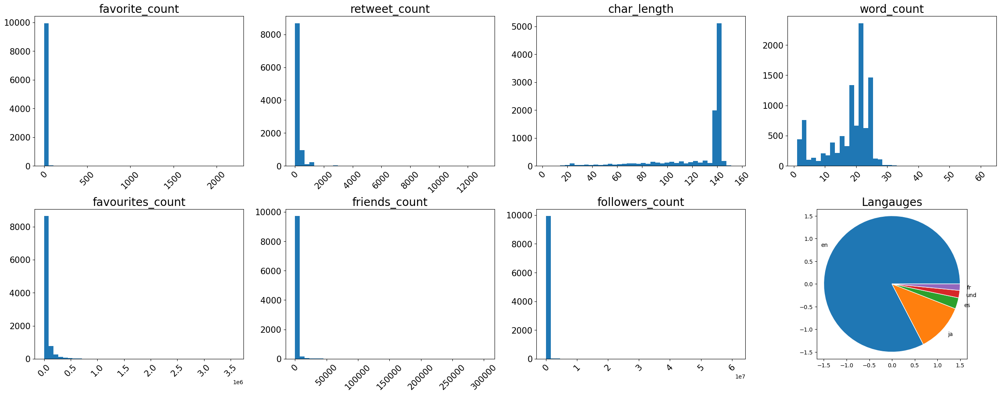

In [84]:
fig = plt.figure(figsize=(25, 15))

df1 = df.select("favorite_count", "retweet_count", "char_length", "word_count", "user.favourites_count", "user.friends_count", "user.followers_count")

for col, num in zip(df1.describe().columns[1:], range(1, 8)):
    ax = fig.add_subplot(3, 4, num).hist(df1.toPandas()[col], bins=40)
    plt.xticks(rotation=45, fontsize=15)
    plt.yticks(fontsize=15)
    plt.title(col, fontsize=20)

# Pie chart showing number of tweets in different languages
df2 = df.groupBy("lang").count().sort(F.desc("count"))
counts = df2.toPandas()["count"][:5]
langs = df2.toPandas()["lang"][:5]
lang_pie = fig.add_subplot(3, 4, 8).pie(
    counts,
    labels=langs,
    radius=1.5,
    wedgeprops={"linewidth": 1, "edgecolor": "white"},
    frame=True,
)
plt.title("Langauges", fontsize=20)

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.show()

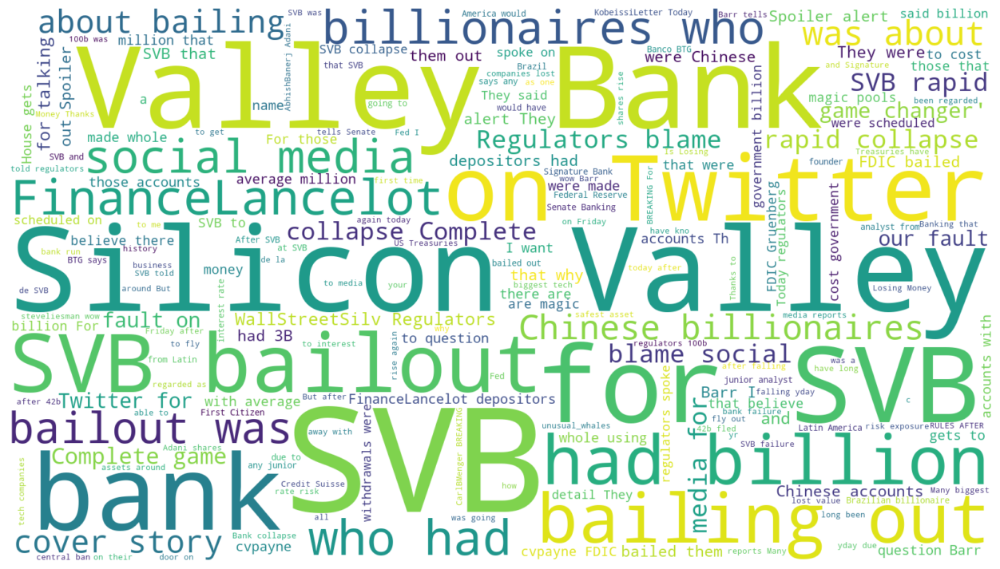

In [85]:
tweets = df.agg(F.collect_list("text")).toPandas()["collect_list(text)"][0]

plt.figure(figsize=(16, 9))
wc = WordCloud(
    width=1600,
    height=900,
    background_color="white",
    stopwords=["https", "http", "t.co", "The", "t", "co", "RT", "of", "in", "It", "s"],
).generate(" ".join(tweets))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.show()

In [86]:
df.select("user")

DataFrame[user: struct<contributors_enabled:boolean,created_at:string,default_profile:boolean,default_profile_image:boolean,description:string,entities:struct<description:struct<urls:array<struct<display_url:string,expanded_url:string,indices:array<bigint>,url:string>>>,url:struct<urls:array<struct<display_url:string,expanded_url:string,indices:array<bigint>,url:string>>>>,favourites_count:bigint,follow_request_sent:boolean,followers_count:bigint,following:boolean,friends_count:bigint,geo_enabled:boolean,has_extended_profile:boolean,id:bigint,id_str:string,is_translation_enabled:boolean,is_translator:boolean,lang:string,listed_count:bigint,location:string,name:string,notifications:boolean,profile_background_color:string,profile_background_image_url:string,profile_background_image_url_https:string,profile_background_tile:boolean,profile_banner_url:string,profile_image_url:string,profile_image_url_https:string,profile_link_color:string,profile_sidebar_border_color:string,profile_sidebar_

In [133]:
user_df = df.select(F.col("user.*"))
locations = user_df.select("location").toPandas()
user_df.filter(user_df.geo_enabled == True).groupBy("location").count().sort(F.desc("count")).show()
user_df.groupBy("location").count().sort(F.desc("count")).show(10, False)

+--------------------------+-----+
|                  location|count|
+--------------------------+-----+
|                          |  564|
|            Washington, DC|   39|
|              New York, NY|   38|
|             United States|   37|
|    干し芋リスト作りました|   25|
|                     India|   19|
|                       USA|   19|
|               Wall Street|   16|
|                  New York|   16|
|             New York, USA|   15|
|                Texas, USA|   14|
|           London, England|   13|
|             Mumbai, India|   11|
|                    London|   10|
|神奈川県横浜市中区＆戸塚区|   10|
|             New York City|   10|
|          Washington, D.C.|   10|
|          Philadelphia, PA|   10|
|                      日本|   10|
|             San Francisco|    9|
+--------------------------+-----+
only showing top 20 rows

+---------------+-----+
|location       |count|
+---------------+-----+
|               |3967 |
|United States  |151  |
|New York, NY   |99   |
|Washington, DC 

C:\Users\sar_m\anaconda3\envs\mynewenv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 24178 (\N{CJK UNIFIED IDEOGRAPH-5E72}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\sar_m\anaconda3\envs\mynewenv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12375 (\N{HIRAGANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\sar_m\anaconda3\envs\mynewenv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 33419 (\N{CJK UNIFIED IDEOGRAPH-828B}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\sar_m\anaconda3\envs\mynewenv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12522 (\N{KATAKANA LETTER RI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\sar_m\anaconda3\envs\mynewenv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12473 (\N{KATAKANA LETTER SU}) missing from 

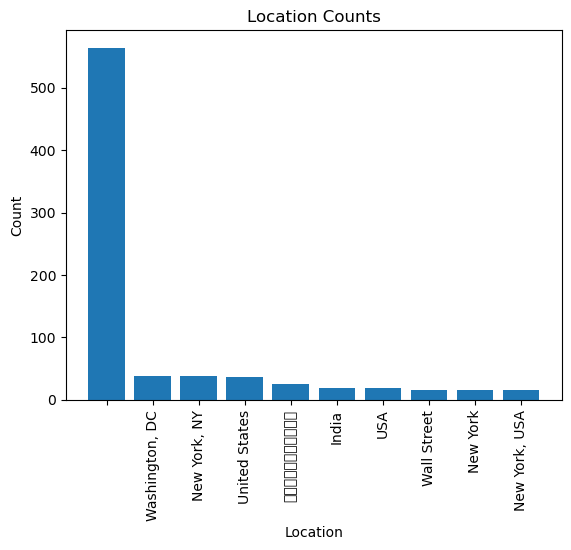

In [88]:
location_counts = user_df.filter(user_df.geo_enabled == True).groupBy("location").count().sort(F.desc("count")).toPandas()
top_locations = location_counts.head(10)
fig, ax = plt.subplots()
ax.bar(top_locations['location'], top_locations['count'])
ax.set_title('Location Counts')
ax.set_xlabel('Location')
ax.set_ylabel('Count')
plt.xticks(rotation=90)
plt.show()


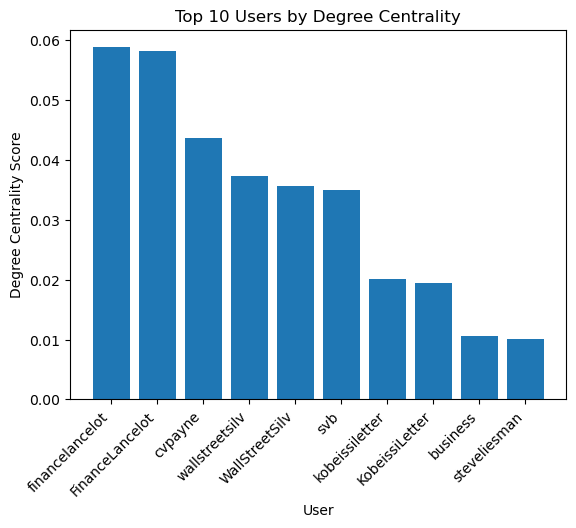

In [89]:
with open("svb.json", "r") as f:
    data = json.load(f)
G = nx.DiGraph()
for tweet in data:
    user = tweet["user"]["screen_name"]
    hashtags = [tag["text"].lower() for tag in tweet["entities"]["hashtags"]]
    mentions = [mention["screen_name"].lower() for mention in tweet["entities"]["user_mentions"]]
    retweet = tweet["retweeted_status"]["user"]["screen_name"] if "retweeted_status" in tweet else None
    G.add_node(user)
    for tag in hashtags:
        G.add_node(tag)
    for mention in mentions:
        G.add_node(mention)
    if retweet:
        G.add_node(retweet)
    for tag in hashtags:
        G.add_edge(user, tag)
    for mention in mentions:
        G.add_edge(user, mention)
    if retweet:
        G.add_edge(user, retweet)
degree_centrality = nx.degree_centrality(G)
sorted_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
users = [user[0] for user in sorted_degree]
scores = [user[1] for user in sorted_degree]
plt.bar(users, scores)
plt.xticks(rotation=45, ha="right")
plt.title("Top 10 Users by Degree Centrality")
plt.xlabel("User")
plt.ylabel("Degree Centrality Score")
plt.show()

In [ ]:
# We have tried Roberta Model but were having errors, so we did sentiment analysis using vader sentiment analysis

''' 

from pyspark.sql.functions import count


def preprocess(tweet):
    rmwords = ["http", "t.co", "www", ".com"]
    final = []
    for w in tweet.replace("RT", "").replace("\n", " ").split(" "):
        if "@" in w and len(w) > 1:
            w = "@user"
        for r in rmwords:
            if r in w:
                w = "http"
        final.append(w)
    return " ".join(final)
preprocessUdf = F.udf(lambda t: preprocess(t), T.StringType())

def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)


labels = ["Negative", "Neutral", "Positive"]
model_name = "cardiffnlp/twitter-roberta-base-sentiment"
roberta_model = AutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)


def analyze_sentiment(text):
    encoded = tokenizer(text, return_tensors="pt")
    out = roberta_model(**encoded)
    scores = softmax(out[0][0].detach().numpy()).tolist()
    return labels[scores.index(max(scores))]


analyzeSentimentUdf = F.udf(lambda text: analyze_sentiment(text), T.StringType())

df3 = (
    df.withColumn("formatted_text", preprocessUdf(F.col("text")))
    .withColumn("model_out", analyzeSentimentUdf(F.col("formatted_text")))
    .select("model_out")
)


df_count = df3.groupBy("model_out").agg(count("*").alias("count"))

count_values = df_count.select("count").rdd.flatMap(lambda x: x).collect()
labels = df_count.select("model_out").rdd.flatMap(lambda x: x).collect()

fig = plt.figure(figsize=(10, 10))
plt.pie(
    count_values,
    labels=labels,
    autopct='%1.1f%%',
    shadow=True,
    startangle=90
)
plt.axis('equal')
plt.title("Overall Sentiment", fontsize=20)
plt.show()





'''

In [90]:
with open("svb.json", "r") as f:
    data = json.load(f)
analyzer = SentimentIntensityAnalyzer()
for tweet in data:
    text = tweet["text"]
    sentiment = analyzer.polarity_scores(text)
    if sentiment['compound'] > 0.05:
        label = "positive"
    elif sentiment['compound'] < -0.05:
        label = "negative"
    else:
        label = "neutral"
    print(f"Text: {text}")
    print(f"Sentiment: {label} ({sentiment['compound']:.2f})")
    print("="*50)

Text: RT @es_tradingview: ¡El banco estadounidense SVB llegó a caer a un centavo la acción! 😵 https://t.co/rKk8xLYzkq
Sentiment: negative (-0.29)
Text: RT @CNN: Regulators revealed that customers of Silicon Valley Bank tried to withdraw $100 billion from the bank the day it failed https://t…
Sentiment: negative (-0.51)
Text: The Congressional inquiry into the failures of Silicon Valley Bank and Signature Bank continues today in the House.… https://t.co/j2I2eDTGOo
Sentiment: negative (-0.46)
Text: RT @CNBC: LIVE: House Financial Services Committee holds hearing on SVB and Signature Bank collapses
https://t.co/Vb6ycorJ9T
Sentiment: negative (-0.30)
Text: RT @KobeissiLetter: The FDIC said the 10 largest accounts at SVB had $13.3 billion in deposits.

This means 8% of SVB’s deposits were held…
Sentiment: neutral (0.00)
Text: RT @tsuchie88: 極めつけが、SVB破綻に続く金融の混乱が将来的な金融規制強化の方向に向かえば、開業にこぎつけたところで先行きがよくわからなくなってしまう。テック企業の株価下落で、ZHDの親会社SBの資産も目減りしているし、ジャックマー帝国の解体と個別上場など、直近…
Sentiment: neutral (0.00)


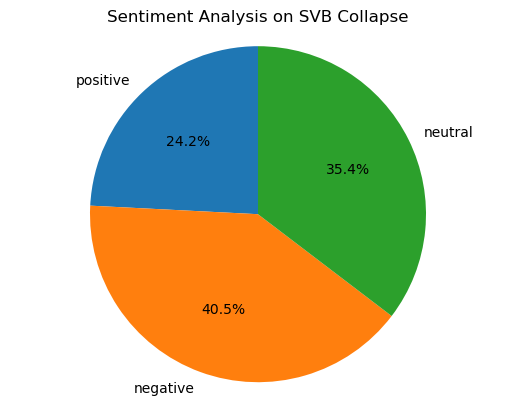

In [91]:
with open("svb.json", "r") as f:
    data = json.load(f)
analyzer = SentimentIntensityAnalyzer()
sentiments = {'positive': 0, 'negative': 0, 'neutral': 0}
for tweet in data:
    text = tweet["text"]
    sentiment = analyzer.polarity_scores(text)
    if sentiment['compound'] > 0.05:
        label = "positive"
    elif sentiment['compound'] < -0.05:
        label = "negative"
    else:
        label = "neutral"
    sentiments[label] += 1
labels = sentiments.keys()
sizes = sentiments.values()
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
ax1.axis('equal')
ax1.set_title("Sentiment Analysis on SVB Collapse")
plt.show()

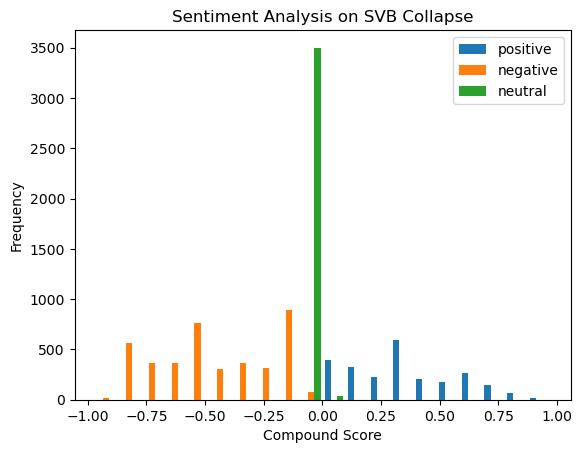

In [92]:
with open("svb.json", "r") as f:
    data = json.load(f)
analyzer = SentimentIntensityAnalyzer()
positive_scores = []
negative_scores = []
neutral_scores = []
for tweet in data:
    text = tweet["text"]
    sentiment = analyzer.polarity_scores(text)
    if sentiment['compound'] > 0.05:
        positive_scores.append(sentiment['compound'])
    elif sentiment['compound'] < -0.05:
        negative_scores.append(sentiment['compound'])
    else:
        neutral_scores.append(sentiment['compound'])
plt.hist([positive_scores, negative_scores, neutral_scores], bins=20, label=['positive', 'negative', 'neutral'])
plt.legend(loc='upper right')
plt.xlabel('Compound Score')
plt.ylabel('Frequency')
plt.title('Sentiment Analysis on SVB Collapse')
plt.show()